

- **Risk Factor Analysis:** Identifying how smoking history, environmental exposure, and demographics contribute to lung cancer cases.
- **Predictive Modeling:** Building machine learning models to predict lung cancer diagnosis or survival rates.
- **Geographical Trends:** Comparing lung cancer incidence across different countries and healthcare access levels.
- **Survival Analysis:** Using statistical methods to analyze factors influencing survival rates.



In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("/kaggle/input/lung-cancer-risk-and-trends-across-25-countries/lung_cancer_prediction_dataset.csv")

In [3]:
df.head()

,ID,Country,Population_Size,Age,Gender,Smoker,Years_of_Smoking,Cigarettes_per_Day,Passive_Smoker,Family_History,...,Air_Pollution_Exposure,Occupational_Exposure,Indoor_Pollution,Healthcare_Access,Early_Detection,Treatment_Type,Developed_or_Developing,Annual_Lung_Cancer_Deaths,Lung_Cancer_Prevalence_Rate,Mortality_Rate
0,0,China,1400,80,Male,Yes,30,29,No,No,...,Low,Yes,No,Poor,No,NaN,Developing,690000,2.44,0.0
1,1,Iran,84,53,Male,No,0,0,Yes,No,...,Low,Yes,No,Poor,No,NaN,Developing,27000,2.10,0.0
2,2,Mexico,128,47,Male,Yes,12,6,Yes,No,...,Medium,No,No,Poor,Yes,NaN,Developing,28000,1.11,0.0
3,3,Indonesia,273,39,Female,No,0,0,No,Yes,...,Low,No,No,Poor,No,NaN,Developing,40000,0.75,0.0
4,4,South Africa,59,44,Female,No,0,0,Yes,No,...,Medium,Yes,No,Poor,No,NaN,Developing,15000,2.44,0.0


In [4]:
df.isnull().sum()

ID                                  0
Country                             0
Population_Size                     0
Age                                 0
Gender                              0
Smoker                              0
Years_of_Smoking                    0
Cigarettes_per_Day                  0
Passive_Smoker                      0
Family_History                      0
Lung_Cancer_Diagnosis               0
Cancer_Stage                   211671
Survival_Years                      0
Adenocarcinoma_Type                 0
Air_Pollution_Exposure              0
Occupational_Exposure               0
Indoor_Pollution                    0
Healthcare_Access                   0
Early_Detection                     0
Treatment_Type                 213968
Developed_or_Developing             0
Annual_Lung_Cancer_Deaths           0
Lung_Cancer_Prevalence_Rate         0
Mortality_Rate                      0
dtype: int64

In [5]:
df.drop(columns=['ID', 'Cancer_Stage', 'Treatment_Type'], inplace=True)

In [6]:
df.shape

(220632, 21)

In [7]:
# Set style
sns.set(style="whitegrid")

# Columns for numerical and categorical analysis
numerical_cols = ["Population_Size", "Age", "Years_of_Smoking", "Cigarettes_per_Day", 
                  "Annual_Lung_Cancer_Deaths", "Lung_Cancer_Prevalence_Rate", "Mortality_Rate"]
categorical_cols = ["Country", "Gender", "Smoker", "Passive_Smoker", "Family_History", 
                    "Lung_Cancer_Diagnosis", "Adenocarcinoma_Type", "Developed_or_Developing"]

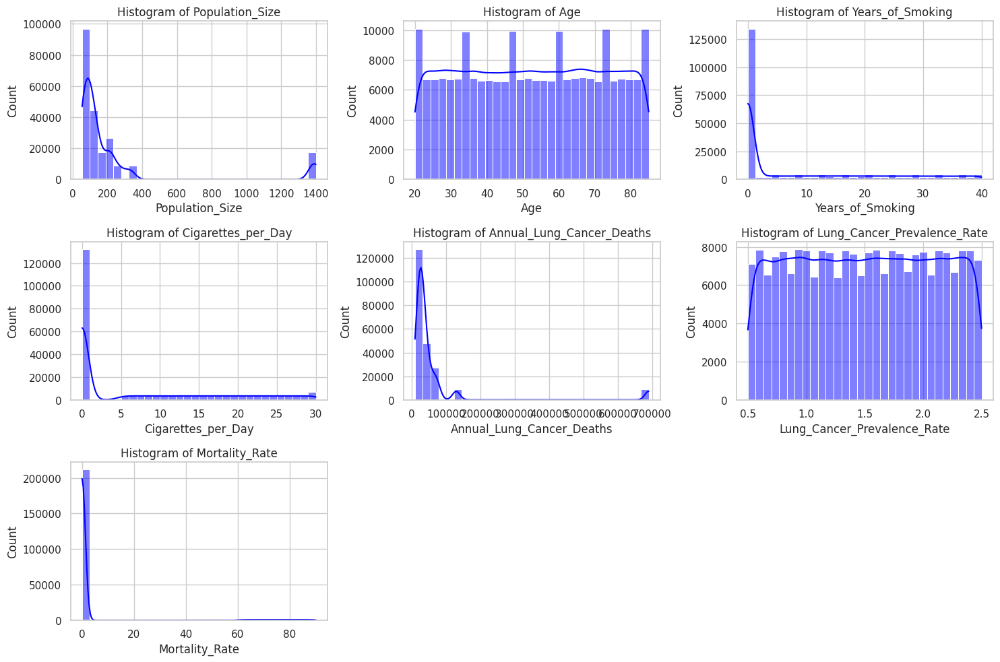

In [8]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(3, 3, i + 1)
    sns.histplot(df[col], bins=30, kde=True, color="blue")
    plt.title(f"Histogram of {col}")
plt.tight_layout()
plt.show()


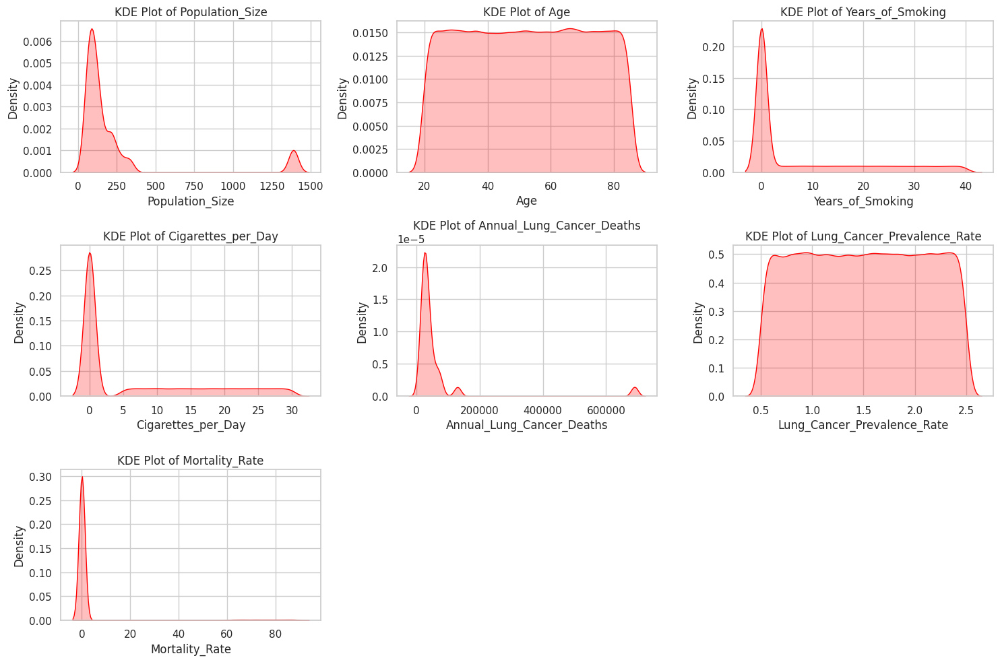

In [9]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(3, 3, i + 1)
    sns.kdeplot(df[col], fill=True, color="red")
    plt.title(f"KDE Plot of {col}")
plt.tight_layout()
plt.show()


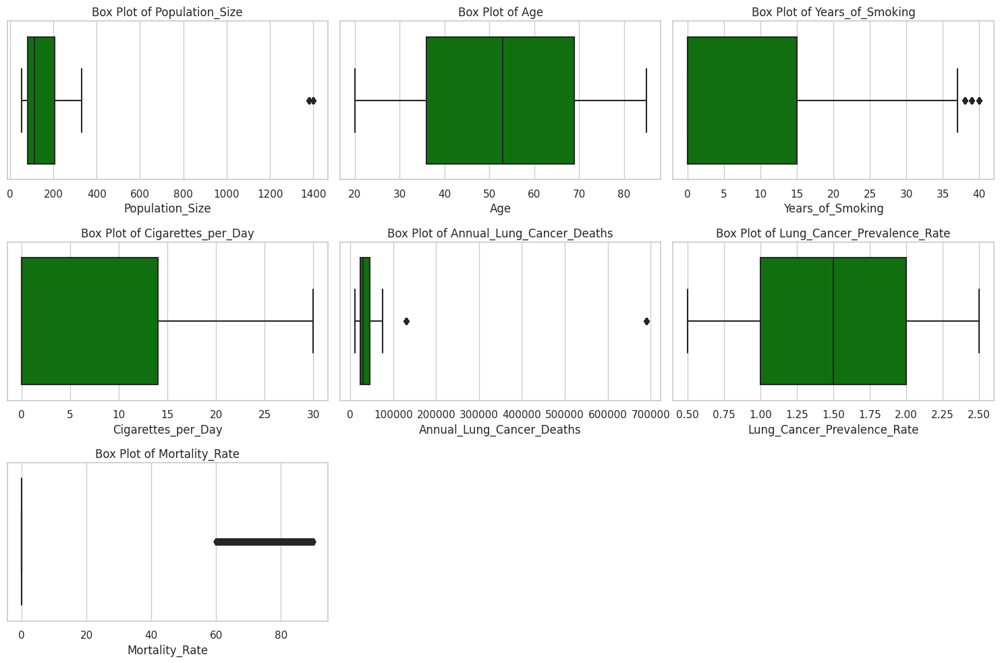

In [10]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(3, 3, i + 1)
    sns.boxplot(x=df[col], color="green")
    plt.title(f"Box Plot of {col}")
plt.tight_layout()
plt.show()


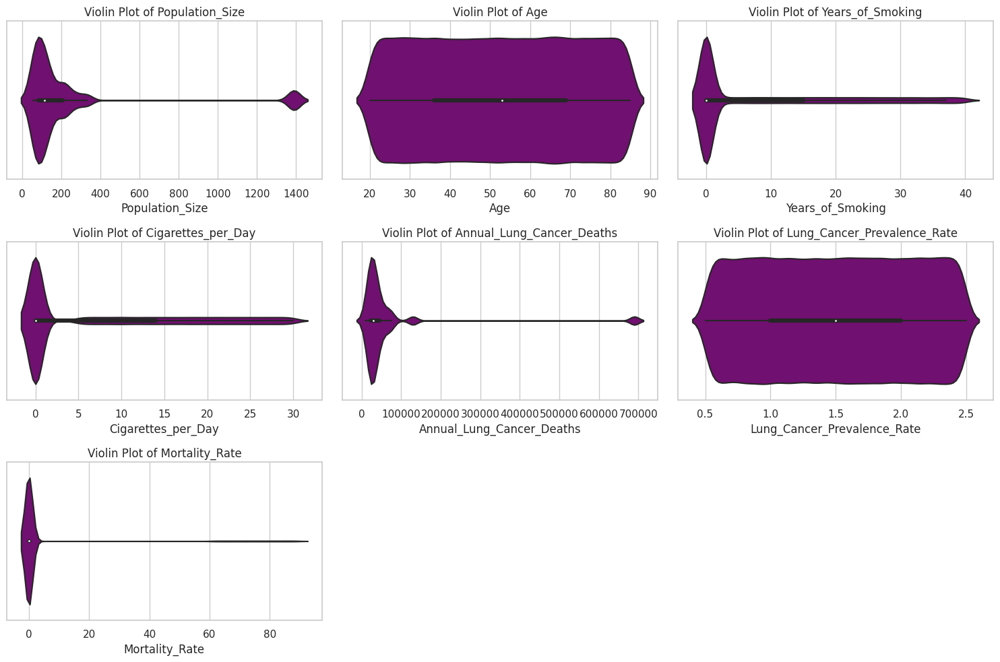

In [11]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(3, 3, i + 1)
    sns.violinplot(x=df[col], color="purple")
    plt.title(f"Violin Plot of {col}")
plt.tight_layout()
plt.show()


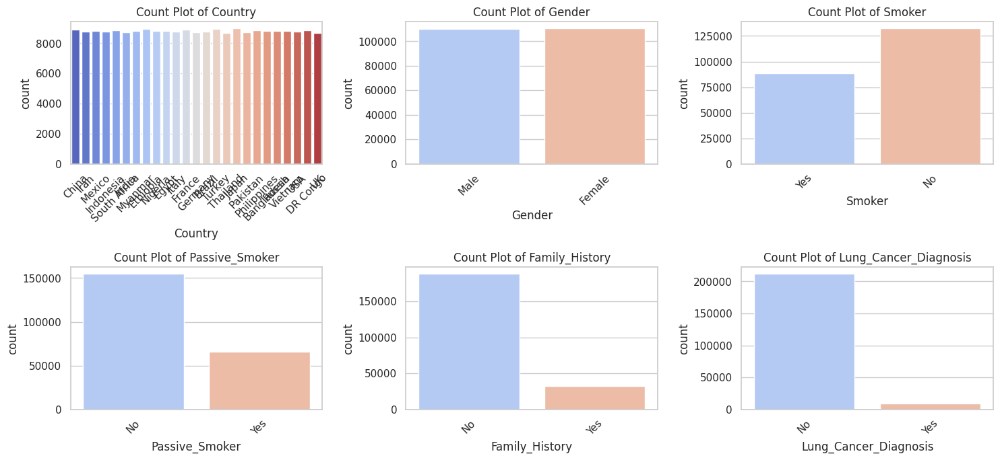

In [14]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(categorical_cols[:6]):  # Limiting to 6 for readability
    plt.subplot(3, 3, i + 1)
    sns.countplot(x=df[col], palette="coolwarm")
    plt.xticks(rotation=45)
    plt.title(f"Count Plot of {col}")
plt.tight_layout()
plt.show()


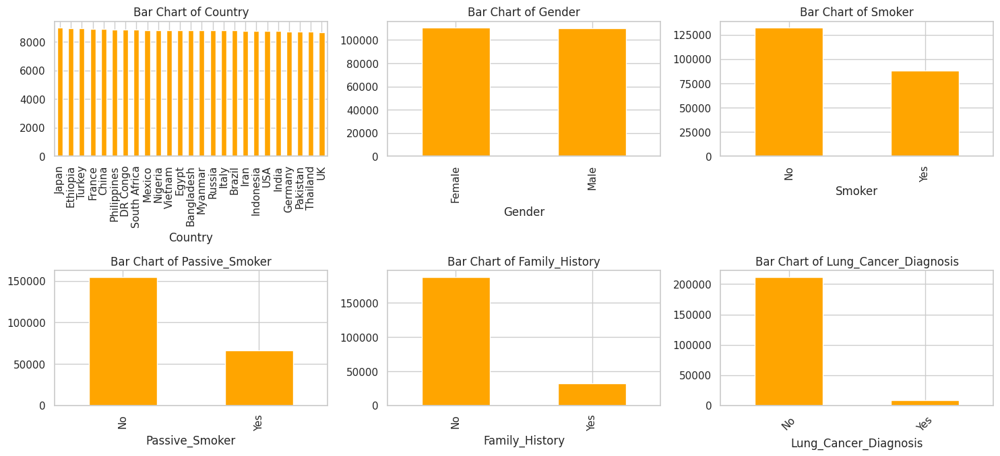

In [13]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(categorical_cols[:6]):
    plt.subplot(3, 3, i + 1)
    df[col].value_counts().plot(kind="bar", color="orange")
    plt.title(f"Bar Chart of {col}")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


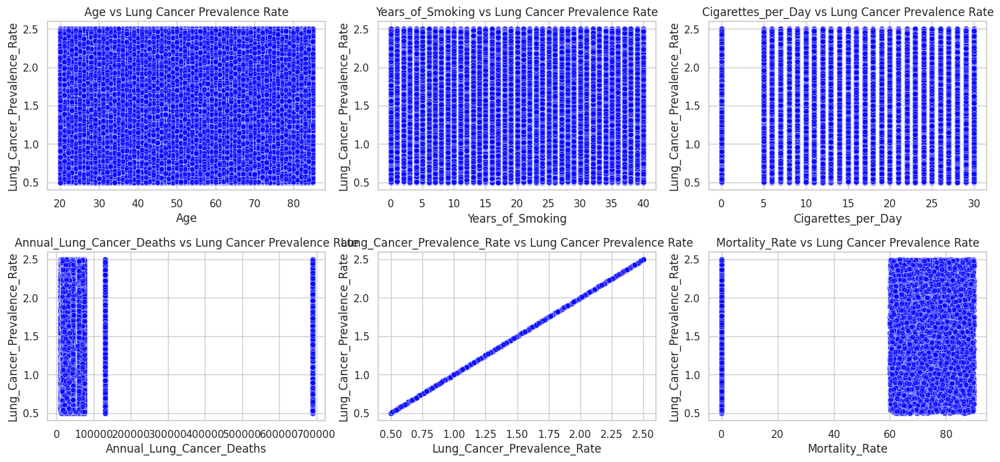

In [15]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols[1:]):  # Excluding first column for better visualization
    plt.subplot(3, 3, i + 1)
    sns.scatterplot(x=df[col], y=df["Lung_Cancer_Prevalence_Rate"], alpha=0.6, color="blue")
    plt.title(f"{col} vs Lung Cancer Prevalence Rate")
plt.tight_layout()
plt.show()


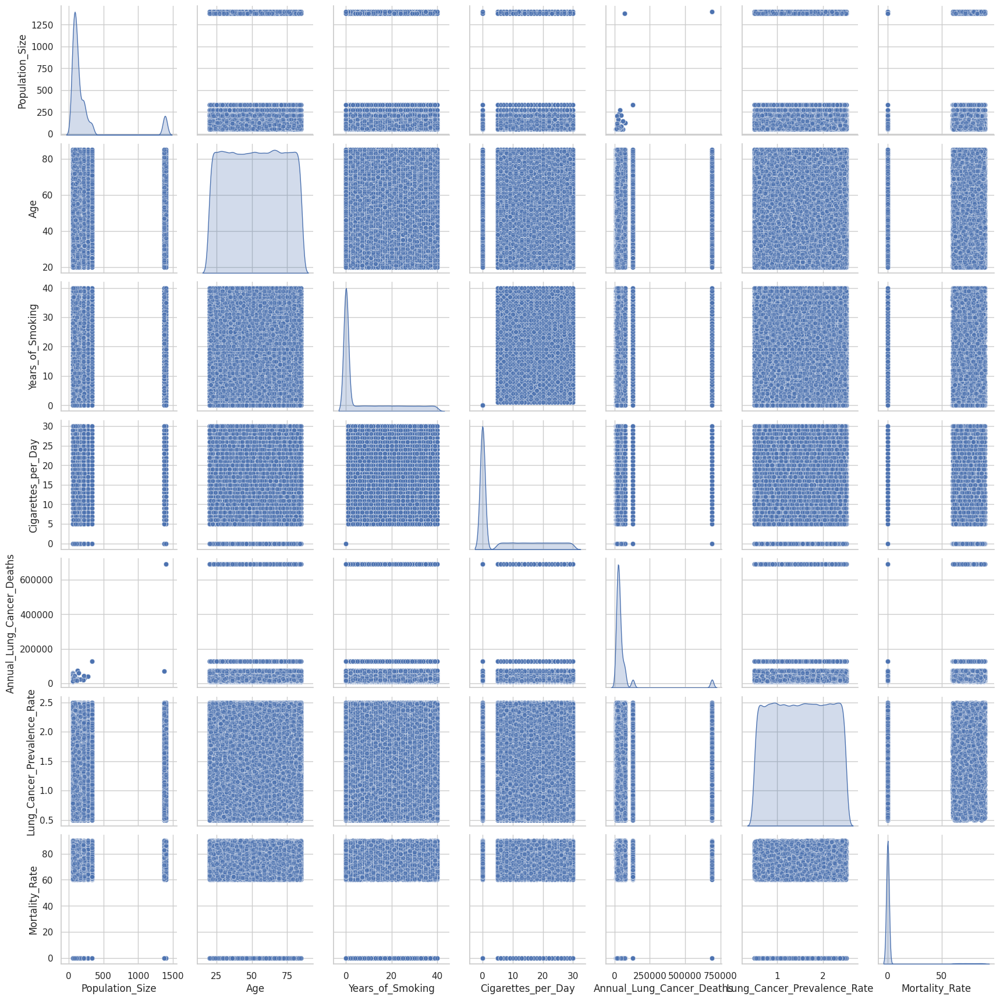

In [16]:
sns.pairplot(df[numerical_cols], diag_kind="kde", plot_kws={"alpha": 0.5})
plt.show()


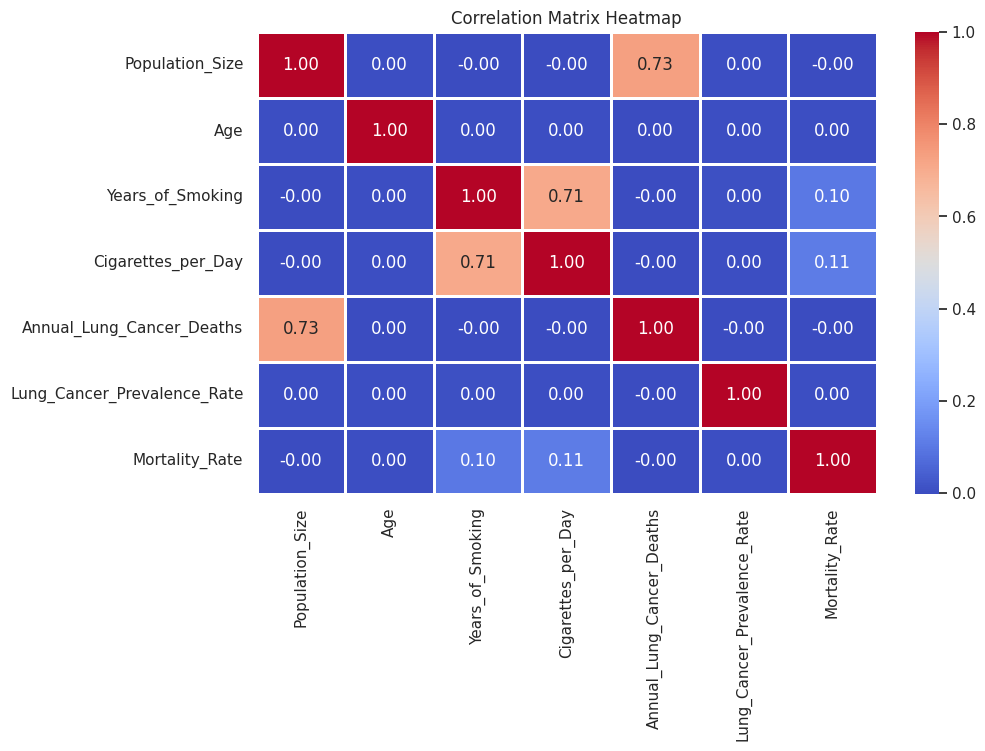

In [17]:
plt.figure(figsize=(10, 6))
correlation_matrix = df[numerical_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=1)
plt.title("Correlation Matrix Heatmap")
plt.show()


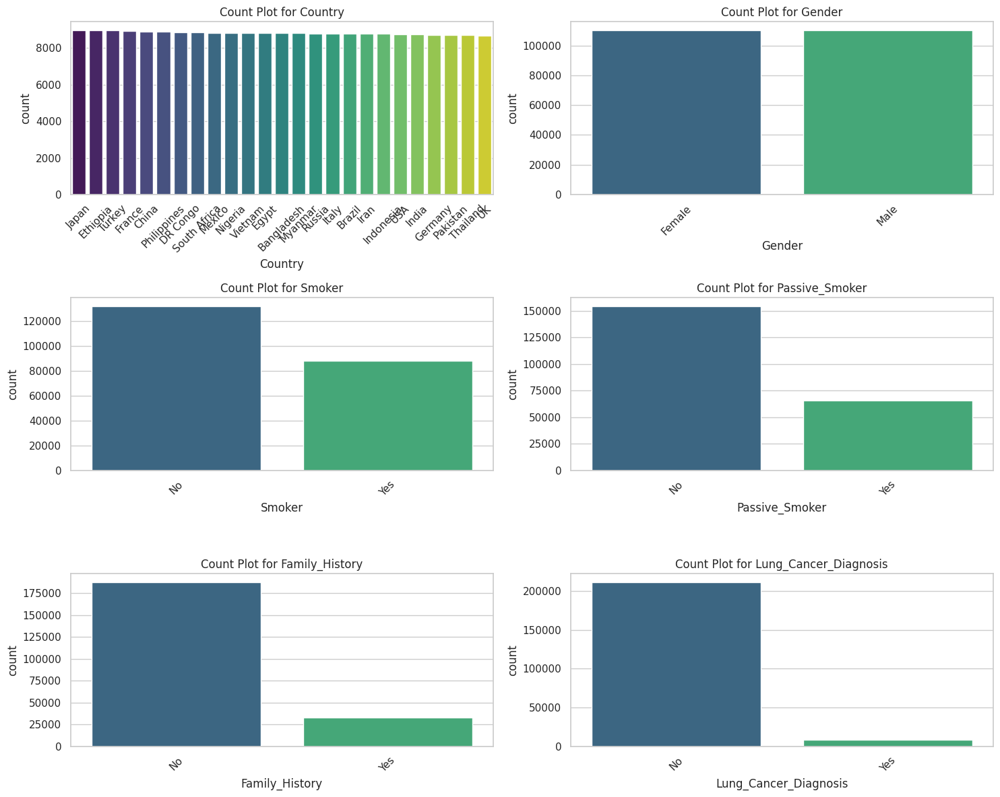

In [18]:
plt.figure(figsize=(15, 12))
for i, col in enumerate(categorical_cols[:6]):  # Select first 6 categorical variables
    plt.subplot(3, 2, i + 1)
    sns.countplot(data=df, x=col, palette="viridis", order=df[col].value_counts().index)
    plt.xticks(rotation=45)
    plt.title(f"Count Plot for {col}")
plt.tight_layout()
plt.show()


In [20]:
import plotly.express as px

In [22]:
fig = px.choropleth(df, 
                    locations="Country", 
                    locationmode="country names",
                    color="Lung_Cancer_Prevalence_Rate",
                    hover_name="Country",
                    color_continuous_scale="Reds",
                    title="Lung Cancer Prevalence Rate by Country")
fig.show()


In [25]:
# 1️⃣ Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier





In [26]:
le = LabelEncoder()
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    df[col] = le.fit_transform(df[col])

In [28]:
# 6️⃣ Feature selection (Define X and y)
X = df.drop(columns=['Lung_Cancer_Diagnosis'])  # Target column: 'Lung_Cancer_Diagnosis'
y = df['Lung_Cancer_Diagnosis']

In [29]:
# 7️⃣ Split dataset into train & test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 8️⃣ Feature scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [30]:
# 9️⃣ Define classification models
models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "Support Vector Machine": SVC(probability=True),
    "Naive Bayes": GaussianNB(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "XGBoost": XGBClassifier(),
    "LightGBM": LGBMClassifier(),
    "CatBoost": CatBoostClassifier(verbose=0)
}


In [31]:
# 🔟 Train and evaluate models
model_results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    model_results[name] = {'Accuracy': acc, 'ROC-AUC': roc_auc}
    print(f"{name}: Accuracy = {acc:.4f}, ROC-AUC = {roc_auc:.4f}")

Logistic Regression: Accuracy = 1.0000, ROC-AUC = 1.0000
Decision Tree: Accuracy = 1.0000, ROC-AUC = 1.0000
Random Forest: Accuracy = 1.0000, ROC-AUC = 1.0000
Gradient Boosting: Accuracy = 1.0000, ROC-AUC = 1.0000
Support Vector Machine: Accuracy = 1.0000, ROC-AUC = 1.0000
Naive Bayes: Accuracy = 1.0000, ROC-AUC = 1.0000
K-Nearest Neighbors: Accuracy = 1.0000, ROC-AUC = 1.0000
XGBoost: Accuracy = 1.0000, ROC-AUC = 1.0000
[LightGBM] [Info] Number of positive: 7126, number of negative: 169379
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 910
[LightGBM] [Info] Number of data points in the train set: 176505, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.040373 -> initscore=-3.168389
[LightGBM] [Info] Start training from score -3.168389
[LightGBM] [Warni

In [32]:
# 1️⃣1️⃣ Convert results to DataFrame
results_df = pd.DataFrame(model_results).T
print("\n✅ Model Performance Summary:\n", results_df.sort_values(by="ROC-AUC", ascending=False))


✅ Model Performance Summary:
                         Accuracy  ROC-AUC
Logistic Regression          1.0      1.0
Decision Tree                1.0      1.0
Random Forest                1.0      1.0
Gradient Boosting            1.0      1.0
Support Vector Machine       1.0      1.0
K-Nearest Neighbors          1.0      1.0
LightGBM                     1.0      1.0
XGBoost                      1.0      1.0
CatBoost                     1.0      1.0
Naive Bayes                  1.0      1.0


In [33]:
# 1️⃣2️⃣ Save best model
best_model_name = results_df.sort_values(by="ROC-AUC", ascending=False).index[0]
best_model = models[best_model_name]
import joblib
joblib.dump(best_model, "best_lung_cancer_model.pkl")
print(f"\n🎯 Best Model Saved: {best_model_name}")


🎯 Best Model Saved: Logistic Regression


In [34]:
# 1️⃣3️⃣ Load and use model for predictions
loaded_model = joblib.load("best_lung_cancer_model.pkl")
sample_input = np.array([X_test[0]])  # Single test example
sample_prediction = loaded_model.predict(sample_input)
print("\n🩺 Sample Prediction:", sample_prediction[0])


🩺 Sample Prediction: 0


In [35]:
# 1️⃣4️⃣ Generate classification report
print("\n📜 Classification Report:\n", classification_report(y_test, loaded_model.predict(X_test)))

# 1️⃣5️⃣ Display final results
print("\n🏆 Final Model Comparison:\n", results_df)


📜 Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     42292
           1       1.00      1.00      1.00      1835

    accuracy                           1.00     44127
   macro avg       1.00      1.00      1.00     44127
weighted avg       1.00      1.00      1.00     44127


🏆 Final Model Comparison:
                         Accuracy  ROC-AUC
Logistic Regression          1.0      1.0
Decision Tree                1.0      1.0
Random Forest                1.0      1.0
Gradient Boosting            1.0      1.0
Support Vector Machine       1.0      1.0
Naive Bayes                  1.0      1.0
K-Nearest Neighbors          1.0      1.0
XGBoost                      1.0      1.0
LightGBM                     1.0      1.0
CatBoost                     1.0      1.0


In [36]:
from sklearn.metrics import confusion_matrix, roc_curve, auc

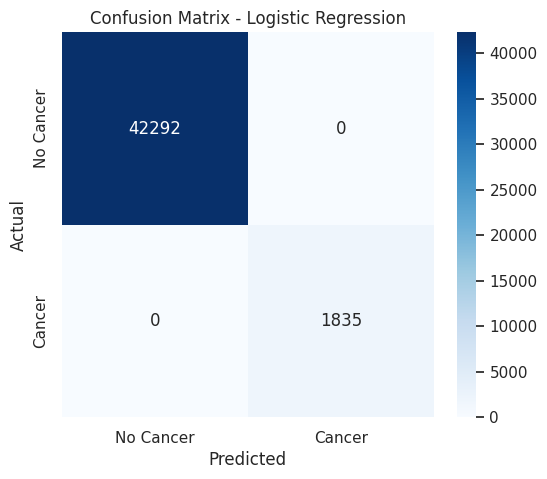

In [37]:
# 3️⃣ Generate Confusion Matrix
y_pred = best_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

# 4️⃣ Plot Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["No Cancer", "Cancer"], yticklabels=["No Cancer", "Cancer"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - {best_model_name}")
plt.show()


In [38]:
# 5️⃣ AUC-ROC Curve
y_prob = best_model.predict_proba(X_test)[:, 1]  # Probability estimates
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

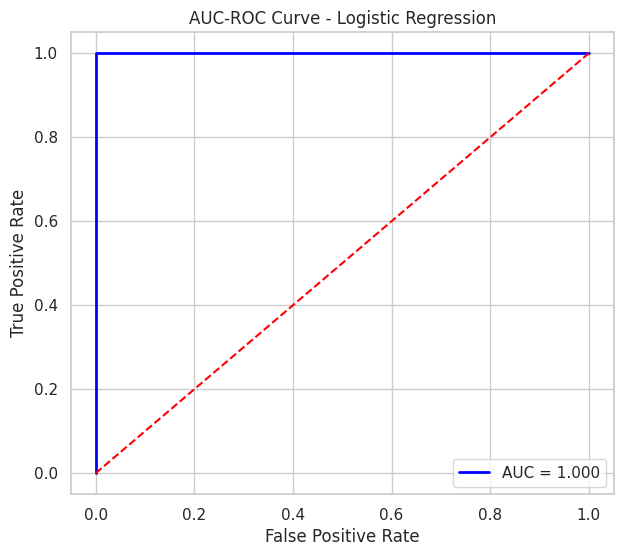

In [39]:
# 6️⃣ Plot AUC-ROC Curve
plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"AUC = {roc_auc:.3f}")
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line (random model)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title(f"AUC-ROC Curve - {best_model_name}")
plt.legend(loc="lower right")
plt.show()

In [40]:
# 7️⃣ Feature Importance Plot (Only for Tree-based models)
if hasattr(best_model, "feature_importances_"):
    feature_importance = best_model.feature_importances_
    feature_names = X.columns

    # Sort by importance
    sorted_idx = np.argsort(feature_importance)[::-1]
    sorted_features = [feature_names[i] for i in sorted_idx]
    sorted_importance = feature_importance[sorted_idx]

    # Plot Feature Importance
    plt.figure(figsize=(10, 6))
    sns.barplot(x=sorted_importance, y=sorted_features, palette="coolwarm")
    plt.xlabel("Importance Score")
    plt.ylabel("Features")
    plt.title(f"Feature Importance - {best_model_name}")
    plt.show()
else:
    print(f"⚠️ Feature importance plot is not available for {best_model_name}")

⚠️ Feature importance plot is not available for Logistic Regression
